# Training GAN with pretrained models

A DCGAN model is trained for image enhancement(superres, decrappify). <br>The dataset used is Flicker Image Dataset, availabe on Kaggle.
For training the model synthetic data is generated as in kernel: https://www.kaggle.com/greenahn/crappify-imgs<br>and saved to disk, which in conjunction with high resolution images are used to train the model.<br><br>
This model is trained by incorporating feature generated from vgg16 model in loss function, as in paper on neural art transfer.<br>
For more details, find the github repository at: https://github.com/nupam/GANs-for-Image-enhancement

Both pretrained generator and discriminator models are loaded from disk, output file of kernel,<br> https://www.kaggle.com/greenahn/pretrain-gan-feature-loss.<br>
They are then put together as a GAN, and trained.

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
print(os.listdir("../input"))

from tqdm import tqdm_notebook as tqdm

import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.utils.mem import *
from fastai.vision.gan import *
import gc
from torchvision.models import vgg16_bn

['pretrain-gan-feature-loss', 'flickr-image-dataset', 'flickrproc']


In [2]:
## These folders contain crappy images in different resolution with differnt crappafication logic (randomly selected)
orig_path = Path('../input/flickrproc/hr/hr')
fnames_df = pd.read_csv('../input/flickrproc/files.csv')
bs = 16
FOLDERS = {256:Path('../input/flickrproc/crappy_256/crappy/'), 320:Path('../input/flickrproc/crappy_320/crappy/'), }
FOLDERS

{256: PosixPath('../input/flickrproc/crappy_256/crappy'),
 320: PosixPath('../input/flickrproc/crappy_320/crappy')}

## Loading Generator

In [3]:
##loading training data
## if dummy=True is provided, then dataset of ony 32 images is retured
def get_data(size=None, bs=None, folder=320, split=0.9, dummy=False):
    if dummy:
        if bs is None: bs = 1
            
        if size is None: 
            data = ImageImageList.from_df(fnames_df.iloc[:32], path = FOLDERS[320], cols='name').split_by_rand_pct(0.2, seed=34).label_from_func(lambda x: orig_path/Path(x).name).databunch(bs=bs).normalize(imagenet_stats, do_y=True)
        else:
            data = ImageImageList.from_df(fnames_df.iloc[:32], path = FOLDERS[320], cols='name').split_by_rand_pct(0.2, seed=34).label_from_func(lambda x: orig_path/Path(x).name).transform([], size=size, tfm_y=True).databunch(bs=bs).normalize(imagenet_stats, do_y=True)
        data.c = 3
        return data
    
    if bs is None: 
        raise ValueError('Batchsize is not provided')
    if size is None:
        raise ValueError('Size of image is not provided')
    
    folder = FOLDERS[folder]
    src = ImageImageList.from_df(fnames_df, 
                           path = folder, cols='name')
    src = src.split_by_idx(np.arange(int(src.items.shape[0]*split), src.items.shape[0]))
    
    data = src.label_from_func(lambda x: orig_path/Path(x).name).transform(get_transforms(max_zoom=1.2), size=size, tfm_y=True).databunch(bs=bs).normalize(imagenet_stats, do_y=True)
    data.c = 3
    return data

In [4]:
base_loss = F.l1_loss
arch = models.resnet34

vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]

def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

Downloading: "https://download.pytorch.org/models/vgg16_bn-6c64b313.pth" to /tmp/.cache/torch/checkpoints/vgg16_bn-6c64b313.pth
100%|██████████| 553507836/553507836 [00:03<00:00, 154805044.10it/s]


### Feature loss
As in paper on neural art tranfer, https://arxiv.org/abs/1508.06576.
L1 pixel distance is also added to loss.<br>
Prevents mode collapse and supervises for stabe and faster training.

In [5]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

In [6]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

In [7]:
gen_data = get_data(bs=bs, size=128, folder=320)

In [8]:
wd = 1e-3
y_range = (-3.,3.)

learn_gen = unet_learner(gen_data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics, blur=True, norm_type=NormType.Weight, model_dir="/kaggle/working", y_range=y_range)
gc.collect();

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /tmp/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:00<00:00, 147779511.96it/s]


In [9]:
learn_gen.load('../input/pretrain-gan-feature-loss/gen_pre')

/opt/conda/lib/python3.6/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type FeatureLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


Learner(data=ImageDataBunch;

Train: LabelList (28604 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: ../input/flickrproc/crappy_320/crappy;

Valid: LabelList (3179 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: ../input/flickrproc/crappy_320/crappy;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_m

## How good is pretrained model?

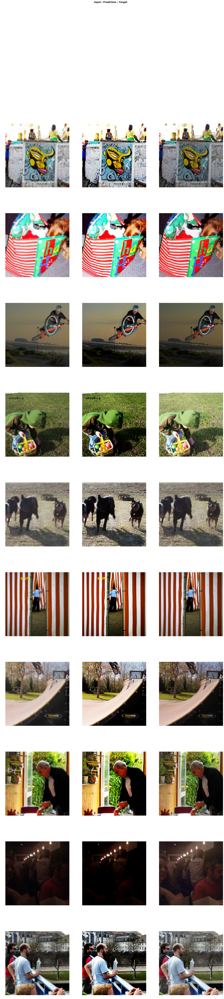

In [10]:
learn_gen.show_results(rows=10, figsize=(24, 100))

## Loading critic

In [11]:
def get_critic_data(bs, size=256, split=0.9):
    
    def labeler(x):
        ret = 'generated' if Path(x).parent.name == 'crappy' else 'original'
        return ret
    
    df = fnames_df
    valid_names = list(df['name'].iloc[int(split*len(df)):])
    
    src1 = ImageList.from_df(df, path = Path('../input/flickrproc/crappy_320')/'crappy', cols='name')
    src2 = ImageList.from_df(df, path = orig_path, cols='name')
    src1.add(items=src2)
    
    src = src1.split_by_valid_func(lambda x : Path(x).name in valid_names)
    data = src.label_from_func(labeler)
    data = data.transform(get_transforms(), size=size).databunch(bs=bs).normalize(imagenet_stats)
    
    data.c = 3
    return data

In [12]:
data_critic = get_critic_data(bs, 128)

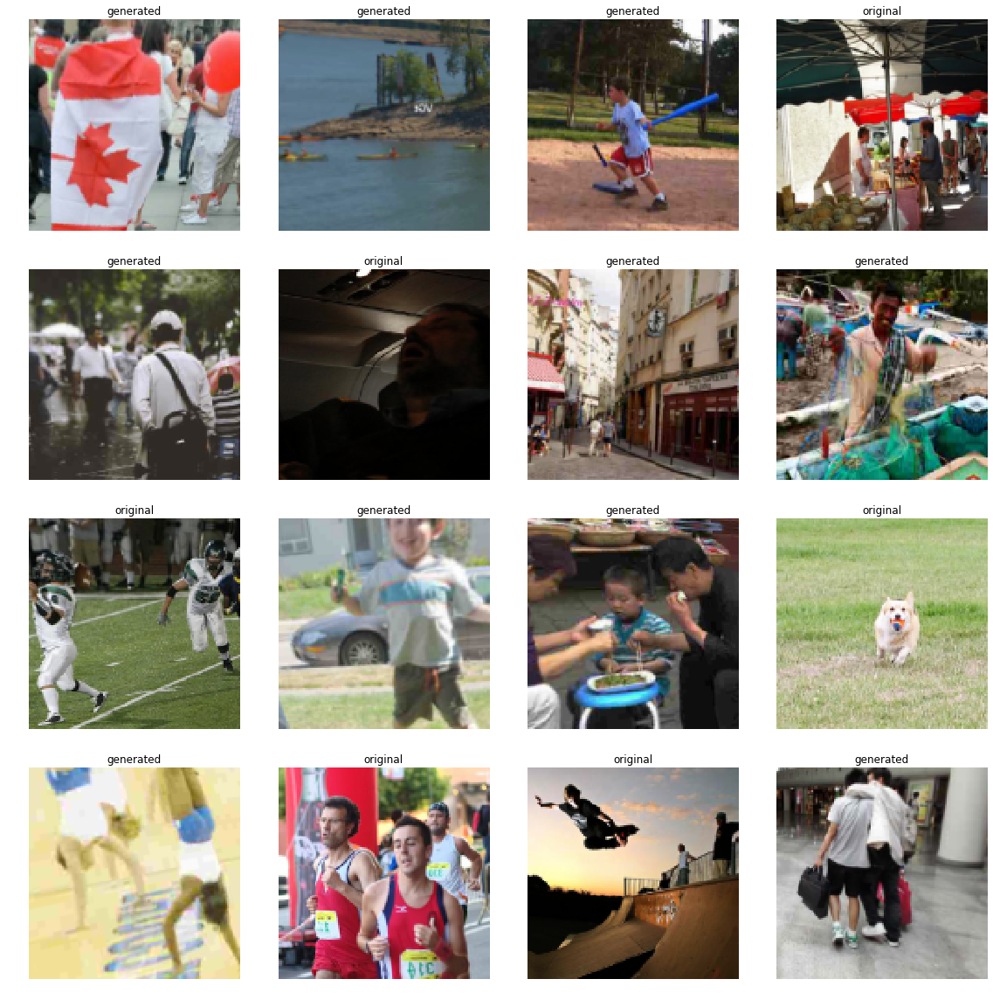

In [13]:
data_critic.show_batch()

In [14]:
loss_critic = AdaptiveLoss(nn.BCEWithLogitsLoss())
def create_critic_learner(data, metrics):
    return   Learner(data_critic, gan_critic(), metrics=metrics, loss_func=loss_critic, wd=wd, model_dir="/kaggle/working")
learn_critic = create_critic_learner(data_critic, accuracy_thresh_expand)
learn_critic.load('../input/pretrain-gan-feature-loss/critic-pre')

Learner(data=ImageDataBunch;

Train: LabelList (57208 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
generated,generated,generated,generated,generated
Path: ../input/flickrproc/crappy_320/crappy;

Valid: LabelList (6358 items)
x: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: CategoryList
generated,generated,generated,generated,generated
Path: ../input/flickrproc/crappy_320/crappy;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace)
  )
  (1): Dropout2d(p=0.075)
  (2): SequentialEx(
    (layers): ModuleList(
      (0): Sequential(
        (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2, inplace)
      )
      (1): Sequential(
        (0): Conv2d(128

### GAN
**Putting both models together as a GAN**

In [15]:
del learn_gen.data
learn_gen.data = get_data(bs=bs, size=128, folder=320)

gc.collect()
torch.cuda.empty_cache()
gpu_mem_get_free()

14577

Training is done by adaptiveliy switching between discriminator and generator.<br>Discriminator is trained whenever discriminator loss drops below 0.65.

In [16]:
switcher = partial(AdaptiveGANSwitcher, critic_thresh=0.65)
learn = GANLearner.from_learners(learn_gen, learn_critic, weights_gen=(1.,50.), show_img=True, switcher=switcher,
                                 opt_func=partial(optim.Adam, betas=(0.,0.99)), wd=wd, model_dir="/kaggle/working", gen_first=True)
learn.callback_fns.append(partial(GANDiscriminativeLR, mult_lr=5.))

In [17]:
lr = 2e-4

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,39.662045,34.026089,102.248688,0.633610,13:10
1,43.427338,50.804798,102.453079,0.628369,12:43


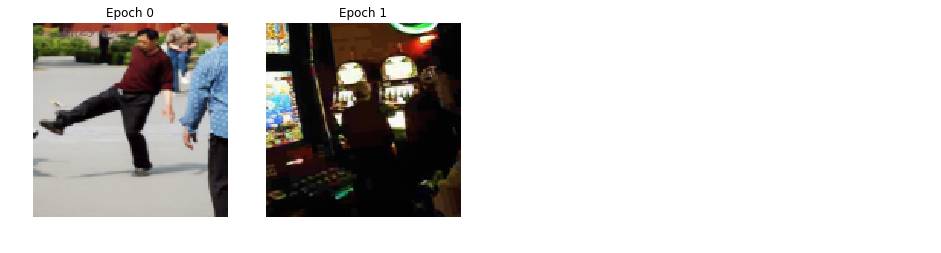

In [18]:
learn.fit(7,lr)

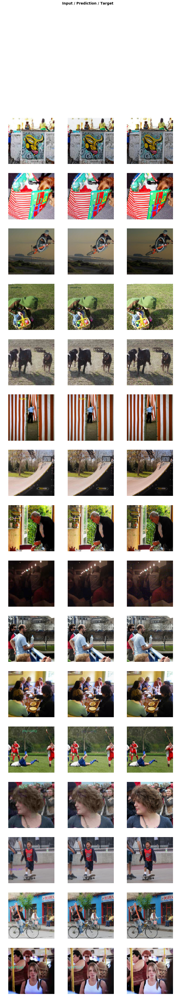

In [19]:
learn.show_results(rows=20, )

In [20]:
learn_gen.save('gen-128')
learn_critic.save('critic-128')

Increasing image size and training again

In [21]:
del learn.data
learn.data = get_data(256,bs//2, 320)
gc.collect()
torch.cuda.empty_cache()
gpu_mem_get_free()

13055

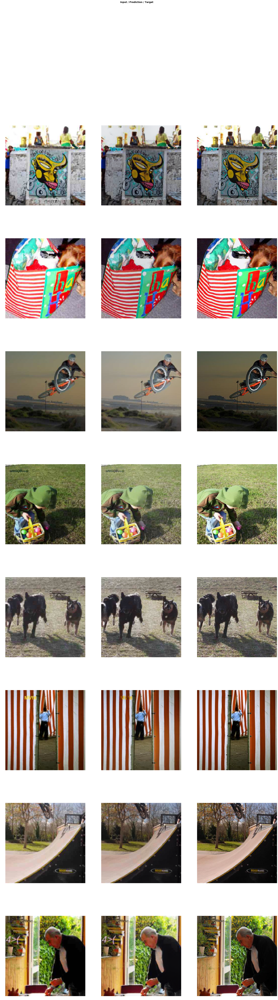

In [22]:
learn.show_results(rows=20, figsize=(30, 100))

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,39.321739,40.532616,83.777733,0.476037,40:41


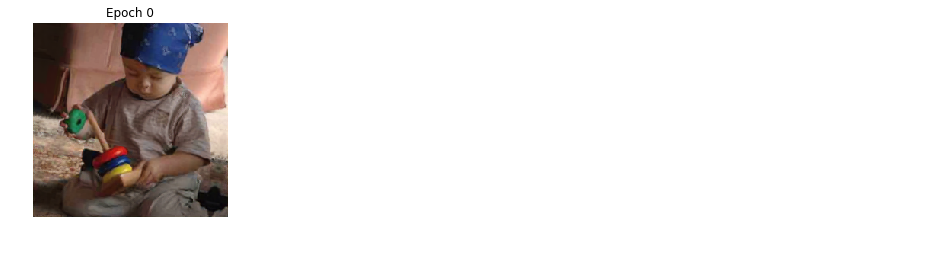

In [23]:
learn.fit(7,lr/2)

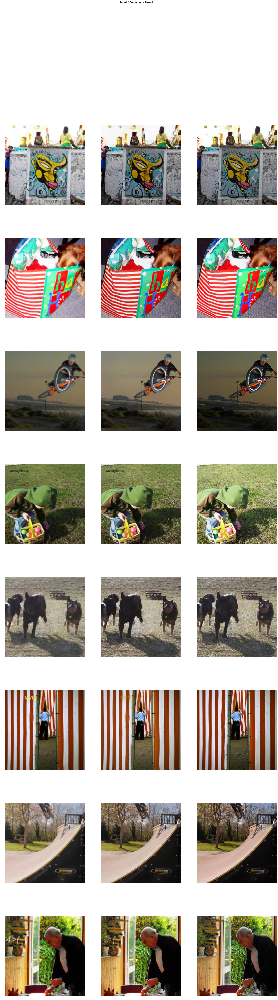

In [24]:
learn.show_results(rows=20, figsize=(30, 100))

Saving models

In [25]:
learn_gen.save('gen-256')
learn_critic.save('critic-256')

In [26]:
learn_gen.export("/kaggle/working/export.pkl")

/opt/conda/lib/python3.6/site-packages/torch/serialization.py:256: UserWarning: Couldn't retrieve source code for container of type FeatureLoss. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [27]:
!ls

__notebook__.ipynb  critic-128.pth  export.pkl	 gen-256.pth
__output__.json     critic-256.pth  gen-128.pth
